# Import libraries

In [1]:
import os
import sys

# Add the root directory to Python path so that we can import the modules
root_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))
sys.path.append(root_dir)

In [2]:
import torchgeo
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchgeo.transforms import AugmentationSequential
from torchvision import transforms as T
import kornia.augmentation as K
from torchgeo.datasets.utils import stack_samples
from lightning.pytorch import Trainer
from torchgeo.models import ResNet50_Weights
from torchgeo.trainers import SemanticSegmentationTask
from torch.utils.data import DataLoader
from pugs_detection.features import create_image_tiles, create_dataset_split
from pugs_detection.modeling.model import modify_first_layer
from pugs_detection.plots import plot_image_tiles, visualize_from_torchgeo_dataloader
from pugs_detection.utils import set_all_seeds

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Set seed to make it reproducible

In [3]:
# Set seeds for reproducibility
set_all_seeds(42)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


# Create image patches (Torchgeo)

## Create image tiles for training, validation, and test set

Manually specify tile

In [4]:
# train, validation, test index list
train_index_list = [3, 6, 7, 8, 11, 12, 13, 15, 16, 18, 19, 20, 22, 23, 25]
val_index_list = [2, 9, 5, 21, 24]
test_index_list = [1, 4, 10, 14, 17]
output_folder_path = '../data/processed/tiles'
image_path = '../data/processed/sentinel-2/stacked_sentinel2_dresden.geotiff'

all_tiles_list = create_image_tiles(output_folder_path, image_path, train_index_list, val_index_list, test_index_list)

width: 27470.0 height: 23010.0
tile width: 5494.0 tile height: 4602.0
Tile 1 saved to ../data/processed/tiles/test/tile_1.geotiff
Tile 2 saved to ../data/processed/tiles/val/tile_2.geotiff
Tile 3 saved to ../data/processed/tiles/train/tile_3.geotiff
Tile 4 saved to ../data/processed/tiles/test/tile_4.geotiff
Tile 5 saved to ../data/processed/tiles/val/tile_5.geotiff
Tile 6 saved to ../data/processed/tiles/train/tile_6.geotiff
Tile 7 saved to ../data/processed/tiles/train/tile_7.geotiff
Tile 8 saved to ../data/processed/tiles/train/tile_8.geotiff
Tile 9 saved to ../data/processed/tiles/val/tile_9.geotiff
Tile 10 saved to ../data/processed/tiles/test/tile_10.geotiff
Tile 11 saved to ../data/processed/tiles/train/tile_11.geotiff
Tile 12 saved to ../data/processed/tiles/train/tile_12.geotiff
Tile 13 saved to ../data/processed/tiles/train/tile_13.geotiff
Tile 14 saved to ../data/processed/tiles/test/tile_14.geotiff
Tile 15 saved to ../data/processed/tiles/train/tile_15.geotiff
Tile 16 saved

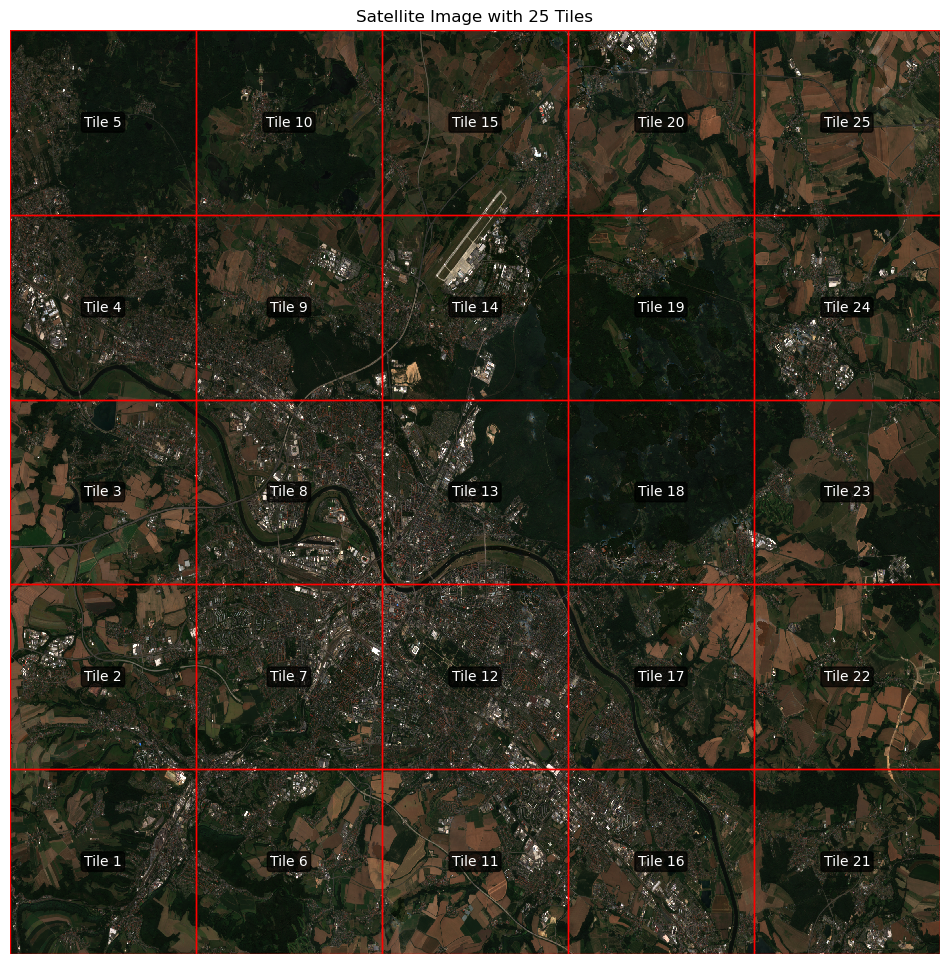

In [5]:
plot_image_tiles(image_path, all_tiles_list)

---

# Define functions for creating patches

In [6]:
import warnings

warnings.filterwarnings(
    "ignore", 
    message="You will likely lose important projection information when converting to a PROJ string from another format.*", 
    category=UserWarning
)

warnings.filterwarnings(
    "ignore",
    message="Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired.*",
    category=UserWarning
)

# Start create patches

In [7]:
# Define paths for pre-split tiles
train_image_path = '../data/processed/tiles/train'
val_image_path = '../data/processed/tiles/val'
test_image_path = '../data/processed/tiles/test'

In [8]:
# Vector data path
# label_path = '../data/processed/osm/public_green_spaces_dresden.geojson'
label_path = '../data/processed/ground truth/dresden_pugs_gt.geojson'

In [9]:
# Create augmentation sequence
# p parameter is the probability of applying the transformation
transform_test = AugmentationSequential(
    # Standard spatial augmentations
    K.RandomHorizontalFlip(p=0.6),
    K.RandomVerticalFlip(p=0.6),
    K.RandomRotation(degrees=45, p=0.5, align_corners=True),
    # Define which keys and indices to apply transformations to
    data_keys=['image', 'mask']
)

In [10]:
# band_list = [1,2,3,4,5,6,7,8,9,10,11,12,14]
band_list = [0,1,2,3,4,5,6,7,8,9,10,11,12,14]

In [11]:
# Create the filtered datasets
train_dataset = create_dataset_split(train_image_path, label_path, 32633, band_list, 'train', transform_test)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [12]:
print(len(train_dataset))

1035


set transform_sequence to None by default or optional params

In [13]:
val_dataset = create_dataset_split(val_image_path, label_path, 32633, band_list, 'validation', None)
test_dataset = create_dataset_split(test_image_path, label_path, 32633, band_list, 'test', None)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149


INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


150
Found 146 valid patches out of 150 total patches
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
Found 142 valid patches out of 150 total patches


In [14]:
# Create DataLoaders
batch_size = 16

train_loader = DataLoader(
    train_dataset, 
    batch_size=batch_size,
    shuffle=True,
    collate_fn=stack_samples
)

In [15]:
len(train_loader)

65

In [16]:
val_loader = DataLoader(
    val_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples
)

test_loader = DataLoader(
    test_dataset, 
    batch_size=batch_size,
    collate_fn=stack_samples
)

In [17]:
len(test_loader)

9

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Sample 0:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.71


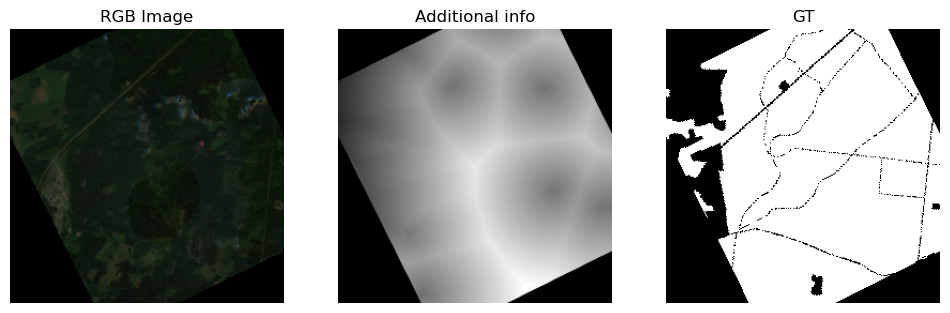

Sample 1:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.06


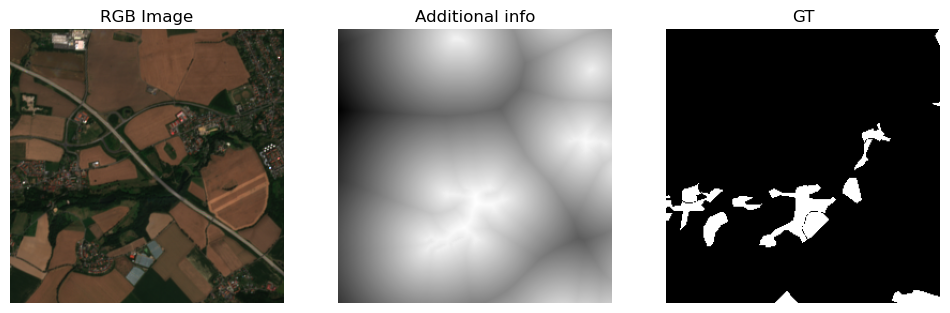

Sample 2:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.05


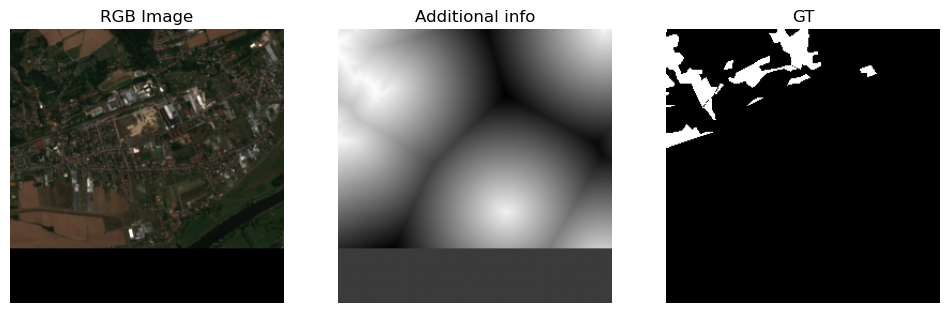

Sample 3:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.10


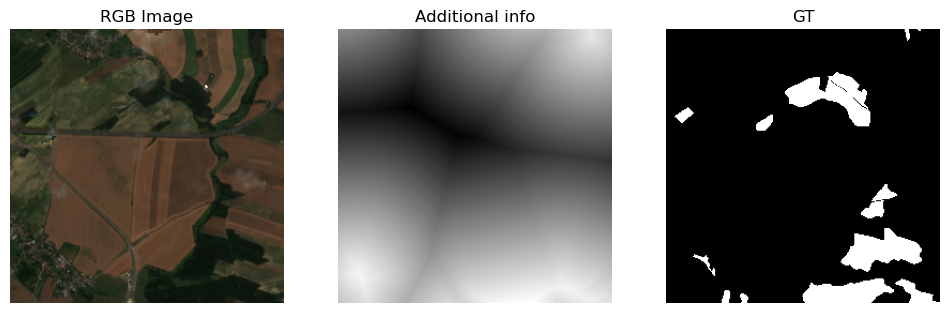

Sample 4:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.06


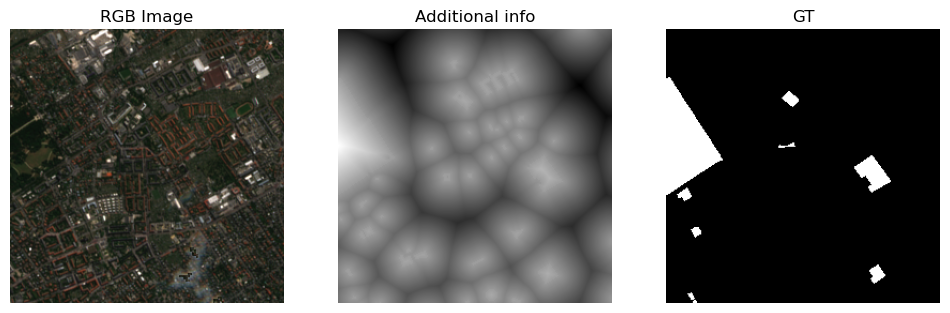

In [18]:
visualize_from_torchgeo_dataloader(train_loader, 5, 'sdt')

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Sample 0:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.10


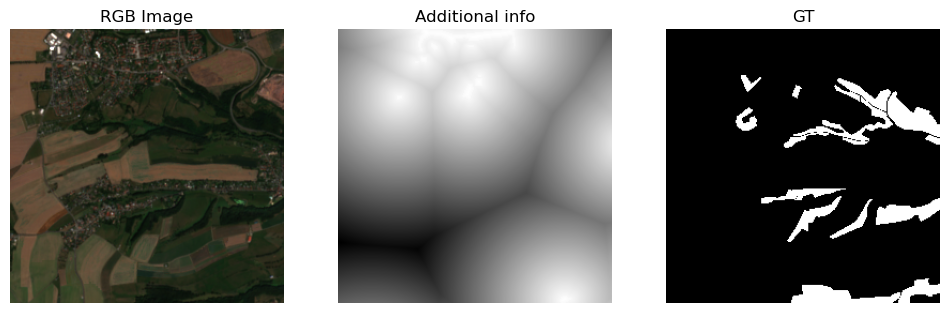

Sample 1:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.14


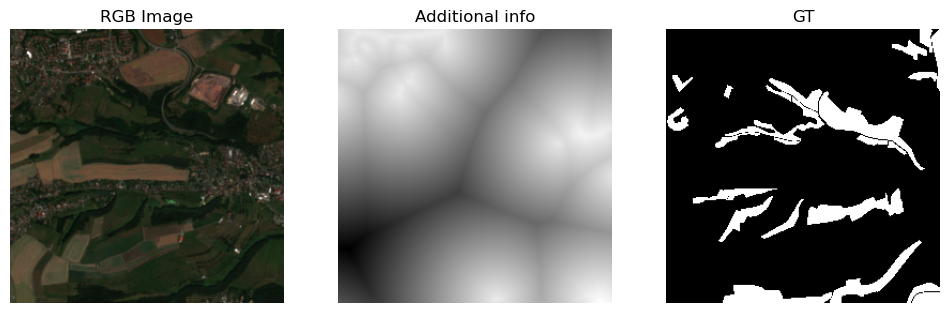

Sample 2:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.16


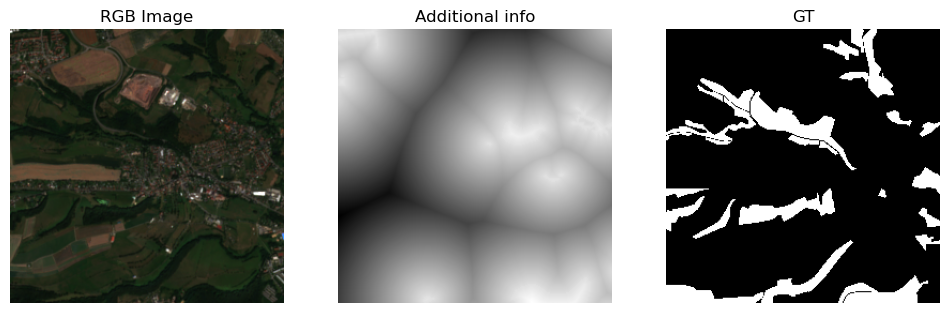

Sample 3:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.13


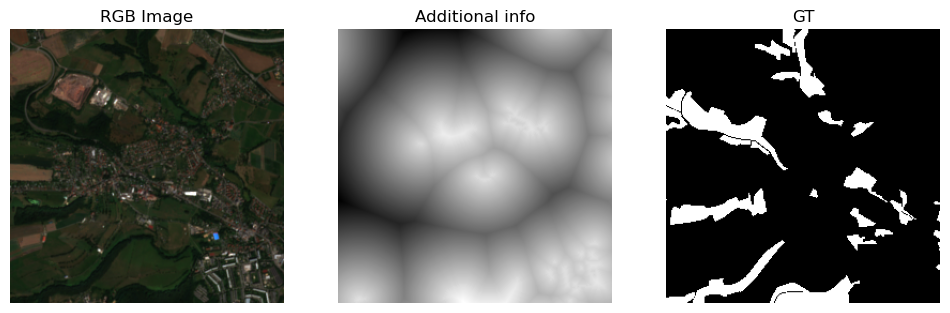

Sample 4:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.14


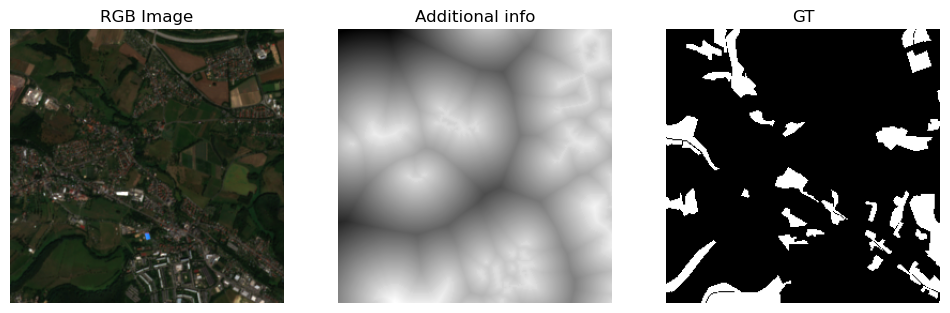

In [19]:
visualize_from_torchgeo_dataloader(val_loader, 5, 'sdt')

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Sample 0:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.37


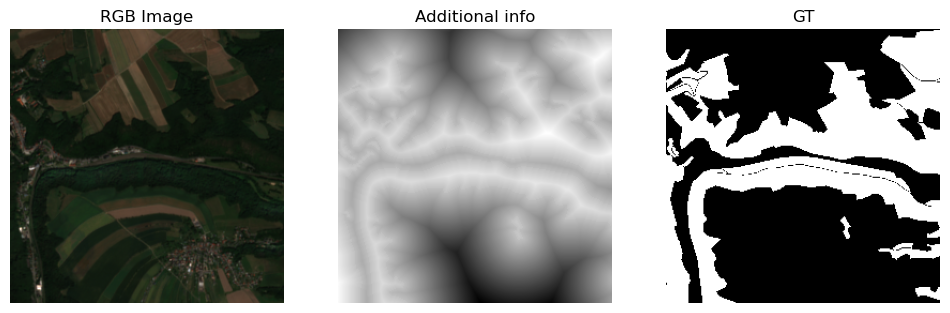

Sample 1:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.39


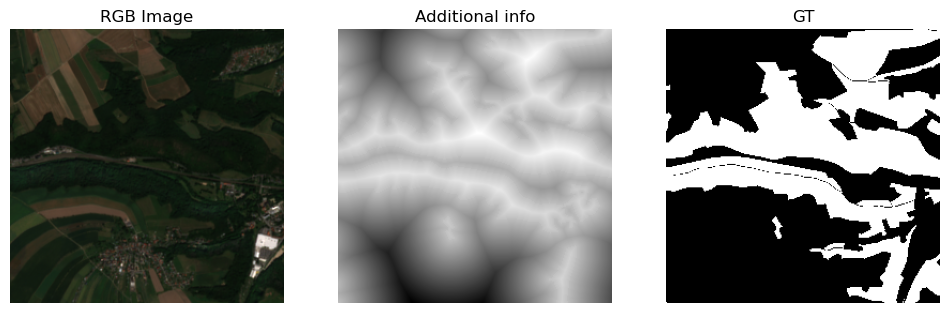

Sample 2:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.40


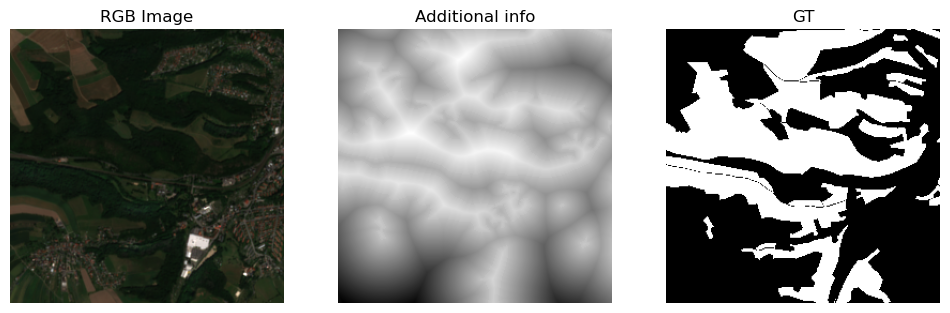

Sample 3:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.44


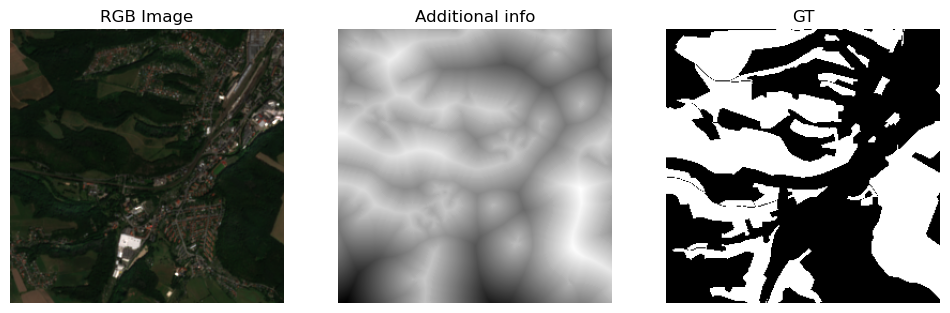

Sample 4:
  Image shape: (14, 256, 256)
  Mask shape: (256, 256)
  Green space percentage: 0.38


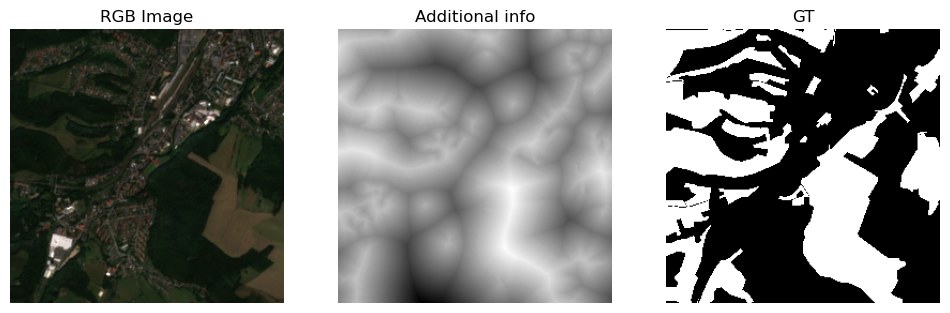

In [20]:
visualize_from_torchgeo_dataloader(test_loader, 5, 'sdt')

# Create and train model

In [21]:
# seed_everything(42, workers=True)

In [22]:
# batch_size = 10
# num_workers = 2
# max_epochs = 10
# fast_dev_run = False

In [23]:
weight_test = ResNet50_Weights.SENTINEL2_ALL_MOCO

## Modified model

13 channels + OSM binary mask

In [24]:
# Use the custom task
task = SemanticSegmentationTask(
    weights=weight_test,
    loss='jaccard',
    model='unet',
    backbone="resnet50",
    num_classes=2,
    in_channels=13,
    lr=0.01,
    patience=5,
)

task = modify_first_layer(task, in_channels=14)

SemanticSegmentationTask(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(14, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (

## Original model

In [37]:
task = SemanticSegmentationTask(
    loss='jaccard',
    model='unet',
    backbone="resnet50",
    weights=weight_test,
    in_channels=13,
    num_classes=2,
    lr=0.01,
    patience=5,
)

## Training

In [25]:
trainer = Trainer(max_epochs=15, deterministic=True)

trainer.fit(model=task, train_dataloaders=train_loader, val_dataloaders=val_loader)

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `lightning.pytorch` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
INFO: 
  | Name          | Type             | Params | Mode 
----------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Epoch 14: 100%|██████████| 65/65 [12:53<00:00,  0.08it/s, v_num=16]

INFO: `Trainer.fit` stopped: `max_epochs=15` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 14: 100%|██████████| 65/65 [12:53<00:00,  0.08it/s, v_num=16]


In [26]:
trainer.test(model=task, dataloaders=test_loader)

/root/miniforge3/envs/pugs-detection-new/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=19` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 9/9 [01:01<00:00,  0.15it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        Test metric               DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  test_MulticlassAccuracy      0.9144537448883057
test_MulticlassJaccardIndex    0.8423904180526733
         test_loss             0.19653896987438202
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.19653896987438202,
  'test_MulticlassAccuracy': 0.9144537448883057,
  'test_MulticlassJaccardIndex': 0.8423904180526733}]

In [28]:
def visualize_predictions(model, test_loader, num_batches=5, samples_per_batch=4):
    # Set model to evaluation mode
    model.eval()
    
    # Iterate through batches
    for batch_idx, batch in enumerate(test_loader):
        if batch_idx >= num_batches:
            break
        
        # Get data
        images = batch["image"]
        masks = batch["mask"]
        
        # Generate predictions
        with torch.no_grad():
            logits = model(images)
            # Ensure predictions have the right shape
            preds = torch.sigmoid(logits)
            preds = (preds > 0.5).float()
            
            # Print shapes for debugging
            print(f"Prediction shape: {preds.shape}")
            print(f"Mask shape: {masks.shape}")
        
        # Create visualization
        num_samples = min(samples_per_batch, images.shape[0])
        fig, axes = plt.subplots(num_samples, 4, figsize=(15, 5*num_samples))
        # fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

        if num_samples == 1:
            axes = axes.reshape(1, 3)
        
        for i in range(num_samples):
            # Get sample
            img = images[i].cpu().numpy()
            mask = masks[i].cpu().numpy()
            pred = preds[i].cpu().numpy()
            
            print(f"Sample {i} - Image shape: {img.shape}, Mask shape: {mask.shape}, Pred shape: {pred.shape}")
            
            # Create RGB visualization for the image
            if img.shape[0] >= 13:
                # Sentinel-2 RGB composite
                rgb = np.stack([img[3], img[2], img[1]], axis=0)
                # rgb = np.stack([img[2], img[1], img[0]], axis=0)
                rgb = np.transpose(rgb, (1, 2, 0))
                rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-7)
            elif img.shape[0] == 3:
                # Standard RGB
                rgb = np.transpose(img, (1, 2, 0))
                rgb = np.clip(rgb, 0, 1)
            elif img.shape[0] == 2:
                # For 2-channel data, use first channel as grayscale
                rgb = img[0]
            else:
                # Grayscale
                rgb = img[0]
            
            # Ensure mask is 2D for plotting
            if mask.ndim > 2:
                if mask.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    mask = mask.squeeze(0)
                else:
                    # Multiple channels, take the first one
                    mask = mask[0]
            
            # Ensure prediction is 2D for plotting
            if pred.ndim > 2:
                if pred.shape[0] == 1:
                    # Single channel but in shape (1, H, W)
                    pred = pred.squeeze(0)
                else:
                    pred = pred[1]
                    print(np.max(pred))
            
            # Plot
            axes[i, 0].imshow(rgb)
            axes[i, 0].set_title("Image")
            axes[i, 0].axis("off")
            
            axes[i, 1].imshow(img[13], cmap="gray")
            axes[i, 1].set_title("OSM mask")
            axes[i, 1].axis("off")

            axes[i, 2].imshow(mask, cmap="gray")
            axes[i, 2].set_title("Ground Truth")
            axes[i, 2].axis("off")

            # axes[i, 1].imshow(mask, cmap="gray")
            # axes[i, 1].set_title("Ground Truth")
            # axes[i, 1].axis("off")
            
            try:
                axes[i, 3].imshow(pred, cmap="gray")
                axes[i, 3].set_title("Prediction")
                axes[i, 3].axis("off")
                # axes[i, 2].imshow(pred, cmap="gray")
                # axes[i, 2].set_title("Prediction")
                # axes[i, 2].axis("off")
            except Exception as e:
                print(f"Error plotting prediction: {e}")
                print(f"Prediction shape: {pred.shape}, dtype: {pred.dtype}")
                # Try alternate approach
                if pred.ndim > 2:
                    pred_2d = pred.mean(axis=0)  # Average across channels
                    axes[i, 2].imshow(pred_2d, cmap="gray")
                else:
                    # Create a blank image
                    blank = np.zeros_like(mask)
                    axes[i, 2].imshow(blank, cmap="gray")
                axes[i, 2].set_title("Prediction (Error)")
                axes[i, 2].axis("off")
        
        plt.tight_layout()
        plt.show()

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


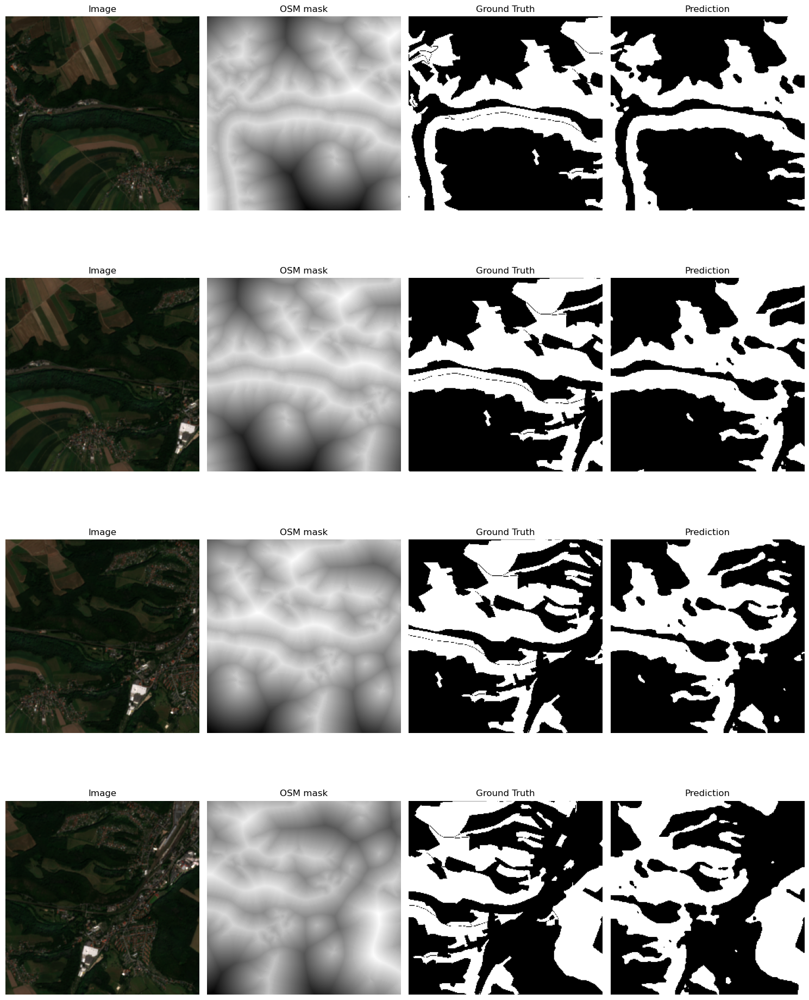

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


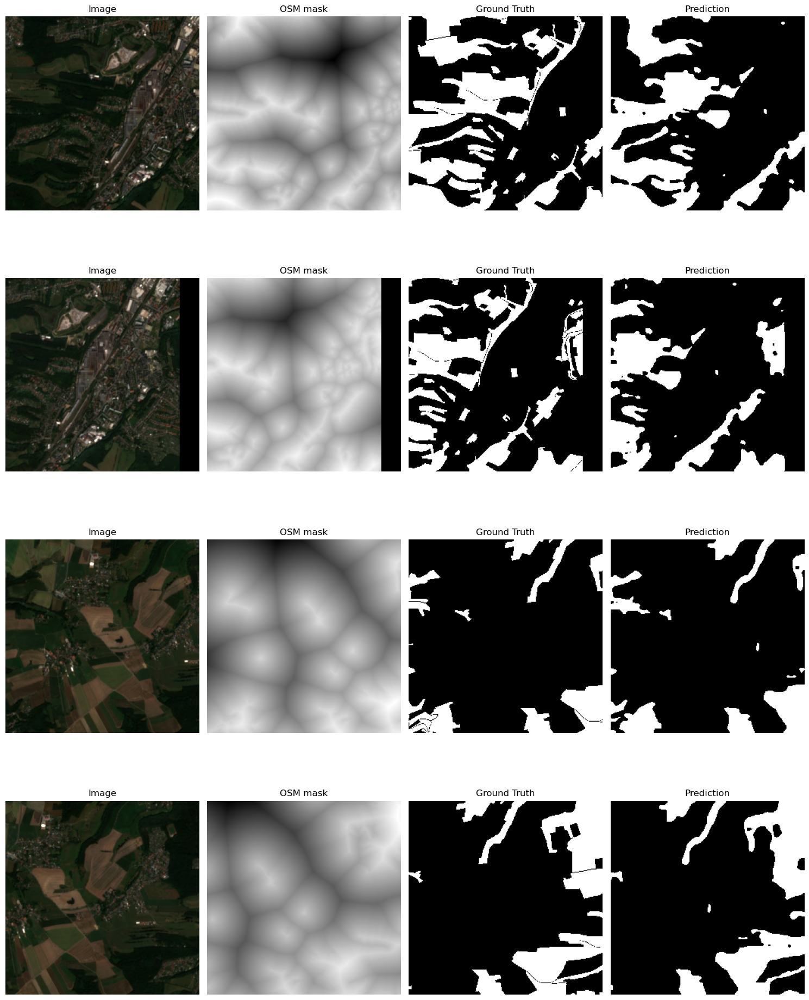

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


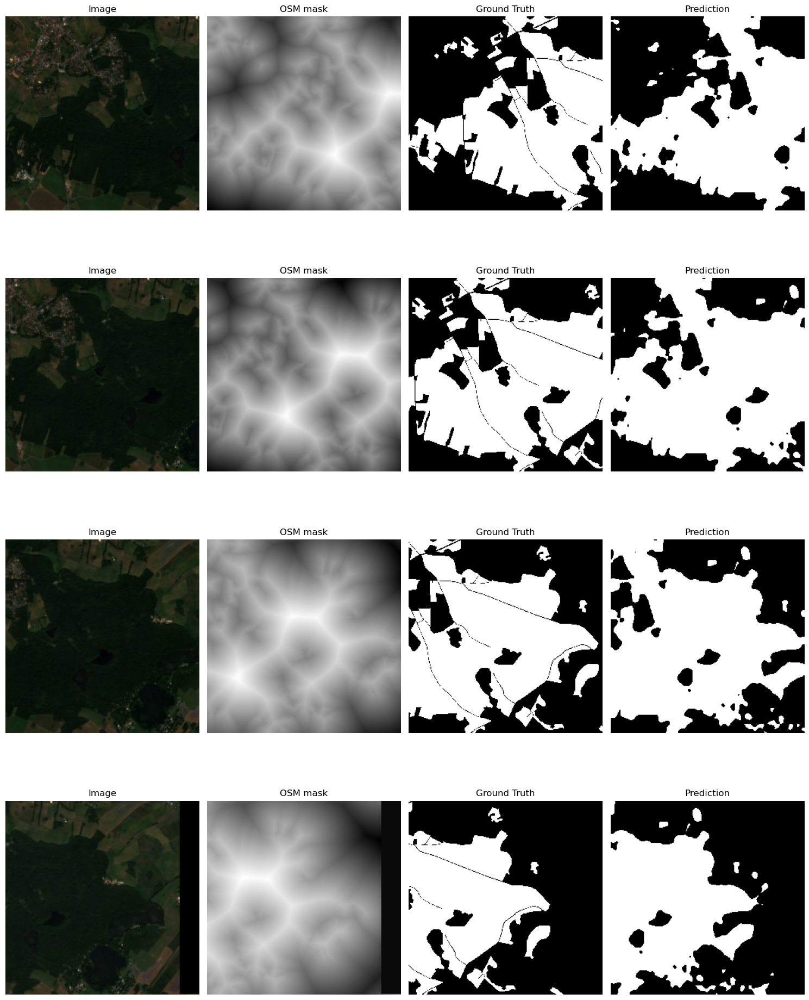

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


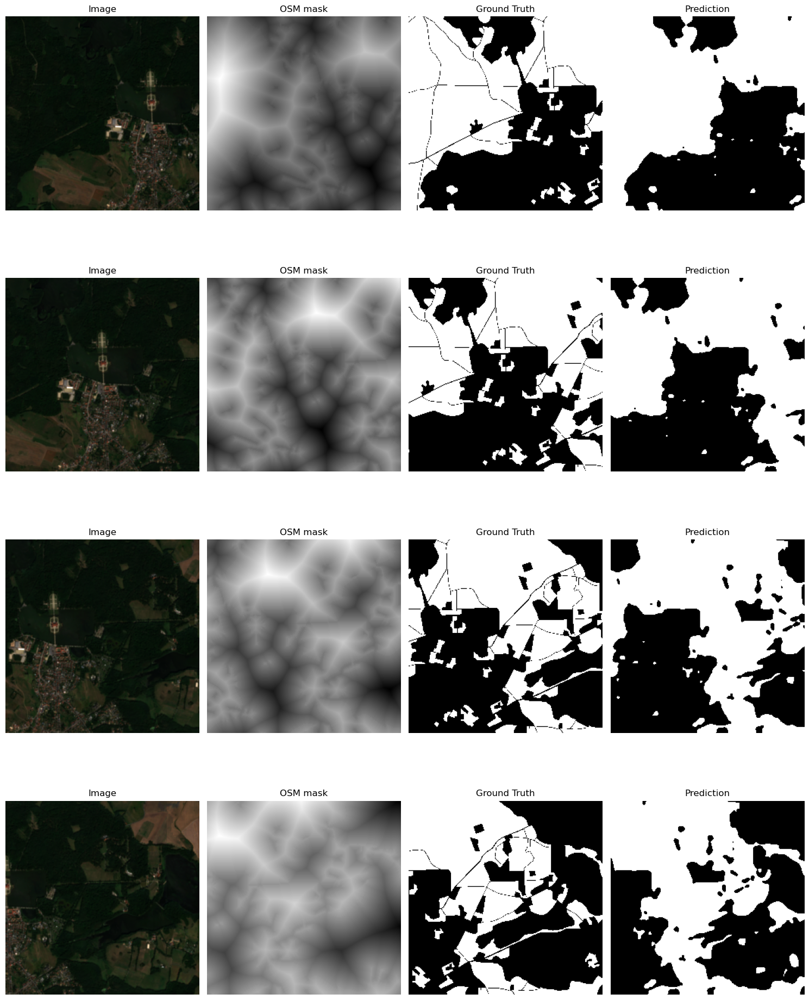

Prediction shape: torch.Size([16, 2, 256, 256])
Mask shape: torch.Size([16, 256, 256])
Sample 0 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 1 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 2 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0
Sample 3 - Image shape: (14, 256, 256), Mask shape: (256, 256), Pred shape: (2, 256, 256)
1.0


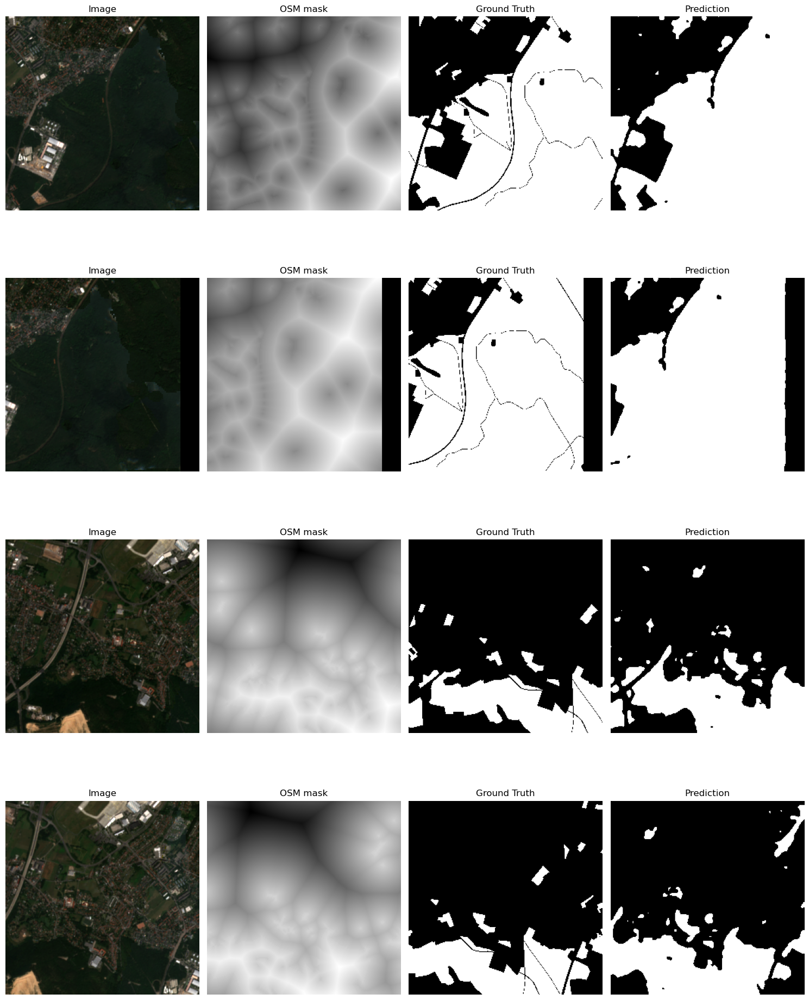

In [29]:
visualize_predictions(task, test_loader)